### Example 2 - Animation of oxygen measurements over time (Poseidon version)

This example will show you how to read and manipulate Argo profiles data stored in parquet format in WHOI's Poseidon cluster.

The data are stored across multiple files: we will load into memory only what we need by applying some filters, and we will create an animation showing the growth of Argo's BCG fleet by showing the dissolved oxygen measurements over time.

##### Note on Poseidon

In this example we will access data stored in WHOI's **Poseidon cluster**. Reading data from WHOI's Amazon S3 data lake is slightly different and we refer you to dedicated examples (manipulating the data once loaded into the memory does not change).

NB: to use this example you need to have access to WHOI's VPN or network, **and** to Boom lab's shared storage at `/vortexfs1/share/boom`.

##### Note on parquet files

The original netCDF Argo files have been converted to parquet format, which provides faster read operations.

There are a couple of way to read parquet files in Python. One is by directly using pandas (make sure you have pyarrow, fastparquet or some other suitable engine installed), the other is with Dask. Generally speaking, you'll want to use Dask if you need a large amount of data at the same time so that you can benefit from its parallelization. You should avoid Dask and just go for pandas whenever the data fits in your RAM.

When reading parquet files with pandas, you can either specificy the file name (if you know which file you want), or the directory containing all the parquet files. In latter case if you apply any filter, pandas and pyarrow will sort through all the files in the folder, reading into memory only the subsets that satisfy your filter.

#### Getting started

We start by importing the necessary modules and setting the path and filenames of the parquet files.

In [1]:
from datetime import datetime
import numpy as np
import pandas as pd
import xarray as xr
import pyarrow.parquet as pq
import glob
parquet_dir = '/vortexfs1/share/boom/data/nc2pqt_test/pqt/'
parquet_files = glob.glob(parquet_dir + '*.parquet')

# We import argopy only for speed comparisons
import argopy

As we want to visualize the growth of Argo's BGC fleet, we don't want to set any geographical or temporal constraint. We still know that all we need to make the animation are the float ID, and the dissolved oxygen data with the coordinates and time of the measurements.

We set this through the `columns` variable in `read_parquet()`, while we set a filter to discard `NaN` values. Note that the pyarrow's syntax cannot explicitly remove non-valid numbers, so we work around this by allowing a number to be inside a very very large range.

In [2]:
%%time
ref_var = 'DOXY_ADJUSTED'
cols = [ref_var,"LATITUDE","LONGITUDE","JULD","PLATFORM_NUMBER"]
filter_nans = [ ("DOXY_ADJUSTED", ">", -1e30), ("DOXY_ADJUSTED", "<", +1e30) ]
df = pd.read_parquet( parquet_files, engine='pyarrow', filters=filter_nans, columns=cols )

CPU times: user 15 s, sys: 7.44 s, total: 22.5 s
Wall time: 4.47 s


It took around 5 seconds to load all the data.

We can now make an animation that shows the evolution of the dissolved oxygen measurements over time since the first measurement available, displaying the growth of the Argo BCG fleet.

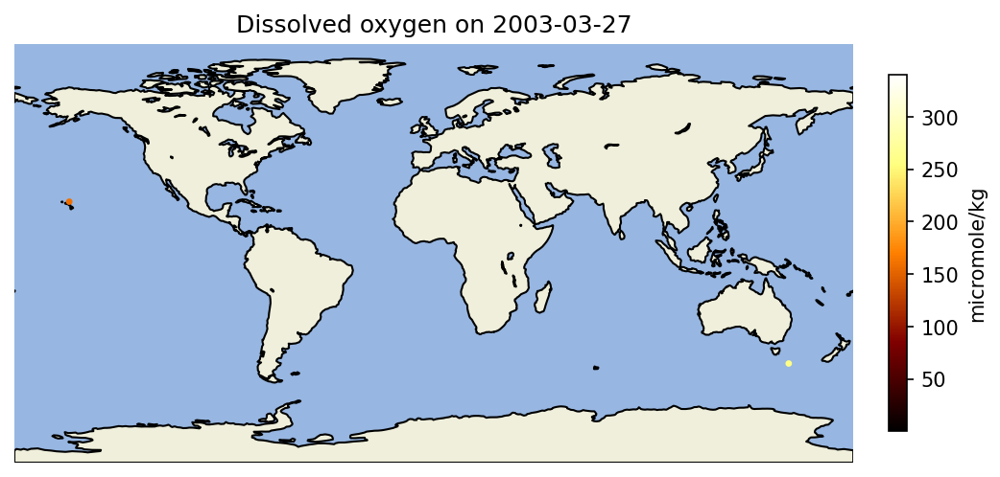

In [3]:
import cartopy
import matplotlib.animation
import matplotlib.pyplot as plt
from matplotlib import colormaps
from datetime import datetime, timedelta
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()

# Group by platform number and time, and aggregate by averaging over oxygen amount and lat/lon coordinates
# The result is a dataframe ordered by platform number first and time second. For each entry we have the average doxy, lat, lon.
df_grouped = df.groupby(['PLATFORM_NUMBER', 'JULD']).agg({
    'DOXY_ADJUSTED': 'mean',
    'LATITUDE': 'mean',
    'LONGITUDE': 'mean'
}).reset_index()

# Start and end of animation
start_t = df_grouped['JULD'].min()
end_t = df_grouped['JULD'].max()

# Setting number of frames for animation
nb_frames = 40

# Setting values of each time to plot
datetime_values = pd.date_range(start=start_t, end=end_t, periods=nb_frames+1).values

# Setting up plot
proj = cartopy.crs.PlateCarree()
fig = plt.figure(figsize=(8, 6), )
ax = fig.add_subplot(projection=proj, frameon=False)

# Setting up colormap
cbar_min = df['DOXY_ADJUSTED'].quantile(q=0.01)
cbar_max = df['DOXY_ADJUSTED'].quantile(q=0.99)
sc = ax.scatter([], [], c=[], cmap='afmhot', vmin=cbar_min, vmax=cbar_max, transform=cartopy.crs.PlateCarree())
cbar = plt.colorbar(sc, ax=ax, fraction=0.02, pad=0.04)
cbar.set_label('micromole/kg')

# note that update() is passed the current frame number by FuncAnimation()
def update(frame):
    plt.cla()
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.LAND, edgecolor='black')
    ax.add_feature(cartopy.feature.LAKES, edgecolor='black')
    t_i = datetime_values[frame]
    t_ip1 = datetime_values[frame+1]
    timestep_df = df_grouped[(df_grouped['JULD'] >= t_i) & (df_grouped['JULD'] <= t_ip1)]
    timestep_df = timestep_df.groupby(['PLATFORM_NUMBER']).agg({
                                 'DOXY_ADJUSTED': 'mean',
                                 'LATITUDE': 'mean',
                                 'LONGITUDE': 'mean',
                                 'JULD': lambda x: x.tolist()
                                 }).reset_index()
    ax.scatter(timestep_df['LONGITUDE'], timestep_df['LATITUDE'], c=timestep_df['DOXY_ADJUSTED'], 
                s=5, cmap='afmhot', vmin=cbar_min, vmax=cbar_max, transform=cartopy.crs.PlateCarree()
                )
    plt.xlim(-180,180)
    plt.ylim(-90,90)
    plt.title("Dissolved oxygen on " + np.datetime_as_string(t_ip1, unit='D'))
    
matplotlib.animation.FuncAnimation(fig, update, frames=nb_frames)